In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np
import squidpy as sq
import matplotlib.pyplot as plt
from statsmodels.stats.multitest import multipletests
from scipy.stats import mannwhitneyu, norm



In [1]:
import utils.paths as d
import utils.utils as u
import utils.functions as f

In [21]:
adata = sc.read_h5ad(d.preprocessed_dir / "adata_annotated_refined_10.h5ad")

c:\Users\sevco\Documents\diplomka\DiplomaThesis\venv\Lib\site-packages\anndata\_core\anndata.py:1882: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


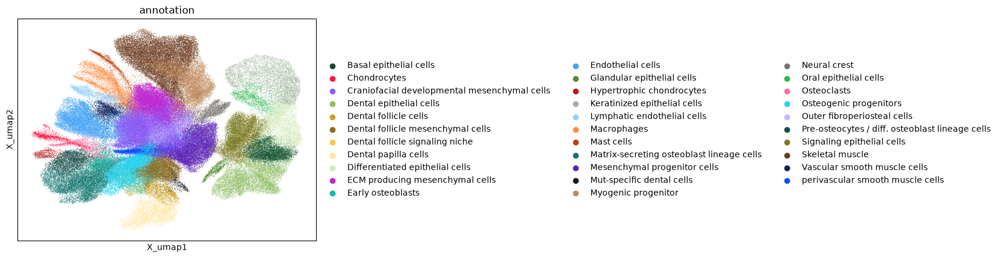

In [76]:
cats = adata.obs["annotation"].cat.categories
sc.pl.embedding(adata, basis="X_umap", color=["annotation"], size=1.5, palette=[u.L2_COLORS[cat] for cat in cats])

In [46]:
ranks = {}
adatas = {
    "wt_1": adata[adata.obs["sample"] == "wt_1"],
    "wt_2": adata[adata.obs["sample"] == "wt_2"],
    "wt_3": adata[adata.obs["sample"] == "wt_3"],
    "wt_4": adata[adata.obs["sample"] == "wt_4"],
    "mut_1": adata[adata.obs["sample"] == "mut_1"],
    "mut_2": adata[adata.obs["sample"] == "mut_2"],
    "mut_3": adata[adata.obs["sample"] == "mut_3"],
    "mut_4": adata[adata.obs["sample"] == "mut_4"],
}

INFO     Creating graph using `None` transform and `1` libraries.                                                  


C:\Users\sevco\AppData\Local\Temp\ipykernel_10972\236245925.py:2: FutureWarning: Calling `spatial_neighbors` is deprecated and will be removed in squidpy v1.9.0. Use `spatial_neighbors_knn`, `spatial_neighbors_radius`, `spatial_neighbors_delaunay`, `spatial_neighbors_grid`, or `spatial_neighbors_from_builder` instead.
  sq.gr.spatial_neighbors(adatas[sample], n_neighs=6)
c:\Users\sevco\Documents\diplomka\DiplomaThesis\venv\Lib\site-packages\scanpy\metrics\_morans_i.py:105: UserWarning: 16 variables were constant, will return nan for these.
  return _MoransI(graph, vals)()


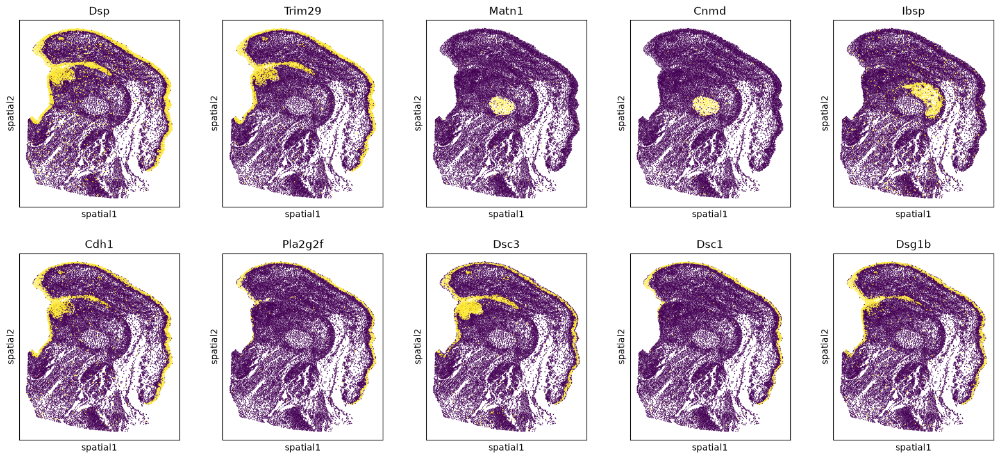

In [53]:
sample = "mut_1"
sq.gr.spatial_neighbors(adatas[sample], n_neighs=6)
sq.gr.spatial_autocorr(adatas[sample], mode="moran", genes=adatas[sample].var_names)
ranks[sample] = adatas[sample].uns["moranI"].sort_values("I", ascending=False).copy()
ranks[sample].index.name = "gene"

ranks[sample].head(10)

with plt.rc_context({"figure.figsize": (3, 4)}):
    sc.pl.embedding(adatas[sample], basis="spatial", color=ranks[sample].index[:10], size=5, ncols=5, cmap="viridis", vmin=0, vmax=1, colorbar_loc=None)

In [49]:
wt, mut = [f"wt_{i}" for i in range(1, 5)], [f"mut_{i}" for i in range(1, 5)]
samples = wt + mut

In [59]:
# ---------- per-section Moran's I (your working setup, looped) ----------
adatas, ranks = {}, {}
for s in samples:
    a = adata[adata.obs["sample"] == s].copy()                 # .copy(): avoid writing into a view
    sq.gr.spatial_neighbors(a, n_neighs=6)
    sq.gr.spatial_autocorr(a, mode="moran", genes=a.var_names) # analytic null; one-sided (I > E[I])
    ranks[s] = a.uns["moranI"].sort_values("I", ascending=False)
    ranks[s].index.name = "gene"
    adatas[s] = a

I = pd.DataFrame({s: ranks[s]["I"] for s in samples})
P = pd.DataFrame({s: ranks[s]["pval_norm"] for s in samples})
ok = I.notna().all(1) & P.notna().all(1)          # gene must be testable in all 8 sections
I, P = I[ok], P[ok]

def bh(p):
    q = pd.Series(np.nan, index=p.index)
    m = p.notna()
    q[m] = multipletests(p[m], method="fdr_bh")[1]
    return q

Q = P.apply(bh, 0)
print("SVGs per section (PFR<0.05):", (Q < 0.05).sum())

INFO     Creating graph using `None` transform and `1` libraries.                                                  


C:\Users\sevco\AppData\Local\Temp\ipykernel_10972\2505943397.py:5: FutureWarning: Calling `spatial_neighbors` is deprecated and will be removed in squidpy v1.9.0. Use `spatial_neighbors_knn`, `spatial_neighbors_radius`, `spatial_neighbors_delaunay`, `spatial_neighbors_grid`, or `spatial_neighbors_from_builder` instead.
  sq.gr.spatial_neighbors(a, n_neighs=6)
c:\Users\sevco\Documents\diplomka\DiplomaThesis\venv\Lib\site-packages\scanpy\metrics\_morans_i.py:105: UserWarning: 11 variables were constant, will return nan for these.
  return _MoransI(graph, vals)()


INFO     Creating graph using `None` transform and `1` libraries.                                                  


C:\Users\sevco\AppData\Local\Temp\ipykernel_10972\2505943397.py:5: FutureWarning: Calling `spatial_neighbors` is deprecated and will be removed in squidpy v1.9.0. Use `spatial_neighbors_knn`, `spatial_neighbors_radius`, `spatial_neighbors_delaunay`, `spatial_neighbors_grid`, or `spatial_neighbors_from_builder` instead.
  sq.gr.spatial_neighbors(a, n_neighs=6)
c:\Users\sevco\Documents\diplomka\DiplomaThesis\venv\Lib\site-packages\scanpy\metrics\_morans_i.py:105: UserWarning: 26 variables were constant, will return nan for these.
  return _MoransI(graph, vals)()


INFO     Creating graph using `None` transform and `1` libraries.                                                  


C:\Users\sevco\AppData\Local\Temp\ipykernel_10972\2505943397.py:5: FutureWarning: Calling `spatial_neighbors` is deprecated and will be removed in squidpy v1.9.0. Use `spatial_neighbors_knn`, `spatial_neighbors_radius`, `spatial_neighbors_delaunay`, `spatial_neighbors_grid`, or `spatial_neighbors_from_builder` instead.
  sq.gr.spatial_neighbors(a, n_neighs=6)
c:\Users\sevco\Documents\diplomka\DiplomaThesis\venv\Lib\site-packages\scanpy\metrics\_morans_i.py:105: UserWarning: 19 variables were constant, will return nan for these.
  return _MoransI(graph, vals)()


INFO     Creating graph using `None` transform and `1` libraries.                                                  


C:\Users\sevco\AppData\Local\Temp\ipykernel_10972\2505943397.py:5: FutureWarning: Calling `spatial_neighbors` is deprecated and will be removed in squidpy v1.9.0. Use `spatial_neighbors_knn`, `spatial_neighbors_radius`, `spatial_neighbors_delaunay`, `spatial_neighbors_grid`, or `spatial_neighbors_from_builder` instead.
  sq.gr.spatial_neighbors(a, n_neighs=6)
c:\Users\sevco\Documents\diplomka\DiplomaThesis\venv\Lib\site-packages\scanpy\metrics\_morans_i.py:105: UserWarning: 5 variables were constant, will return nan for these.
  return _MoransI(graph, vals)()


INFO     Creating graph using `None` transform and `1` libraries.                                                  


C:\Users\sevco\AppData\Local\Temp\ipykernel_10972\2505943397.py:5: FutureWarning: Calling `spatial_neighbors` is deprecated and will be removed in squidpy v1.9.0. Use `spatial_neighbors_knn`, `spatial_neighbors_radius`, `spatial_neighbors_delaunay`, `spatial_neighbors_grid`, or `spatial_neighbors_from_builder` instead.
  sq.gr.spatial_neighbors(a, n_neighs=6)
c:\Users\sevco\Documents\diplomka\DiplomaThesis\venv\Lib\site-packages\scanpy\metrics\_morans_i.py:105: UserWarning: 16 variables were constant, will return nan for these.
  return _MoransI(graph, vals)()


INFO     Creating graph using `None` transform and `1` libraries.                                                  


C:\Users\sevco\AppData\Local\Temp\ipykernel_10972\2505943397.py:5: FutureWarning: Calling `spatial_neighbors` is deprecated and will be removed in squidpy v1.9.0. Use `spatial_neighbors_knn`, `spatial_neighbors_radius`, `spatial_neighbors_delaunay`, `spatial_neighbors_grid`, or `spatial_neighbors_from_builder` instead.
  sq.gr.spatial_neighbors(a, n_neighs=6)
c:\Users\sevco\Documents\diplomka\DiplomaThesis\venv\Lib\site-packages\scanpy\metrics\_morans_i.py:105: UserWarning: 7 variables were constant, will return nan for these.
  return _MoransI(graph, vals)()


INFO     Creating graph using `None` transform and `1` libraries.                                                  


C:\Users\sevco\AppData\Local\Temp\ipykernel_10972\2505943397.py:5: FutureWarning: Calling `spatial_neighbors` is deprecated and will be removed in squidpy v1.9.0. Use `spatial_neighbors_knn`, `spatial_neighbors_radius`, `spatial_neighbors_delaunay`, `spatial_neighbors_grid`, or `spatial_neighbors_from_builder` instead.
  sq.gr.spatial_neighbors(a, n_neighs=6)
c:\Users\sevco\Documents\diplomka\DiplomaThesis\venv\Lib\site-packages\scanpy\metrics\_morans_i.py:105: UserWarning: 10 variables were constant, will return nan for these.
  return _MoransI(graph, vals)()


INFO     Creating graph using `None` transform and `1` libraries.                                                  


C:\Users\sevco\AppData\Local\Temp\ipykernel_10972\2505943397.py:5: FutureWarning: Calling `spatial_neighbors` is deprecated and will be removed in squidpy v1.9.0. Use `spatial_neighbors_knn`, `spatial_neighbors_radius`, `spatial_neighbors_delaunay`, `spatial_neighbors_grid`, or `spatial_neighbors_from_builder` instead.
  sq.gr.spatial_neighbors(a, n_neighs=6)
c:\Users\sevco\Documents\diplomka\DiplomaThesis\venv\Lib\site-packages\scanpy\metrics\_morans_i.py:105: UserWarning: 24 variables were constant, will return nan for these.
  return _MoransI(graph, vals)()


SVGs per section (PFR<0.05): wt_1     1582
wt_2     1593
wt_3     1529
wt_4     1580
mut_1    1504
mut_2    1539
mut_3    1570
mut_4    1544
dtype: int64


In [ ]:
# ---------- level 2: condition-level SVGs (Stouffer + replicate consistency) ----------
def stouffer(p):                                               # Z = Σ Φ⁻¹(1-p_i)/√k
    z = norm.isf(p.clip(1e-300, 1 - 1e-16)).sum(1) / np.sqrt(p.shape[1])
    return pd.Series(norm.sf(z), index=p.index)

res = pd.DataFrame({"I_wt": I[wt].mean(1), "I_mut": I[mut].mean(1),
                    "p_wt": stouffer(P[wt]), "p_mut": stouffer(P[mut]),
                    "nrep_wt": (Q[wt] < 0.05).sum(1), "nrep_mut": (Q[mut] < 0.05).sum(1)})
res["q_wt"], res["q_mut"] = (multipletests(res[c], method="fdr_bh")[1] for c in ("p_wt", "p_mut"))
res["svg_wt"]  = (res.q_wt  < 0.05) & (res.nrep_wt  >= 3)
res["svg_mut"] = (res.q_mut < 0.05) & (res.nrep_mut >= 3)
res["class"] = np.select([res.svg_wt & res.svg_mut, res.svg_wt, res.svg_mut],
                         ["shared", "wt-only (lost)", "mut-only (gained)"], "none")
print(res["class"].value_counts())

class
shared               1465
none                  331
wt-only (lost)         72
mut-only (gained)      45
Name: count, dtype: int64


In [190]:
# wt_only = res[res["class"] == "wt-only (lost)"].copy()
# wt_only.index
# genes, cols, per_page = wt_only.index.tolist(), wt, 8          # cols = wt + mut to see the loss directly

# for i in range(0, len(genes), per_page):
#     page = genes[i:i + per_page]
#     fig, axs = plt.subplots(len(page), len(cols), figsize=(3 * len(cols), 3 * len(page)), squeeze=False)
#     for r, gene in enumerate(page):
#         for c, s in enumerate(cols):
#             ax = axs[r, c]
#             sc.pl.embedding(adatas[s], basis="spatial", color=gene, size=5, cmap="viridis",
#                             vmin=0, vmax=1, colorbar_loc=None, ax=ax, show=False,
#                             title=s if r == 0 else "")          # sample names on top row only
#             ax.set_aspect("equal"); ax.set_xlabel(""); ax.set_ylabel("")
#         axs[r, 0].set_ylabel(gene, fontsize=11, rotation=0, ha="right", va="center")  # gene name at row start
#     plt.tight_layout(); plt.show()

In [73]:
display(res[res["class"]=="wt-only (lost)"].sort_values("I_wt", ascending=False).head(10))
display(res[res["class"]=="mut-only (gained)"].sort_values("I_mut", ascending=False).head(10))

,I_wt,I_mut,p_wt,p_mut,nrep_wt,nrep_mut,q_wt,q_mut,svg_wt,svg_mut,class,U,p_mw,dI,rbc,q_mw
gene,,,,,,,,,,,,,,,,
Gnrh1,0.343233,0.019352,0.0,9.617468e-100,4,2,0.0,1.290197e-99,True,False,wt-only (lost),0.0,0.028571,-0.323880,-1.000,0.123497
Amelx,0.274290,-0.000487,0.0,4.029979e-01,4,0,0.0,4.605346e-01,True,False,wt-only (lost),0.0,0.028571,-0.274777,-1.000,0.123497
Dspp,0.250131,-0.000163,0.0,4.737645e-01,4,0,0.0,4.917236e-01,True,False,wt-only (lost),0.0,0.028571,-0.250294,-1.000,0.123497
Sst,0.221118,0.029420,0.0,1.726167e-302,4,2,0.0,2.480960e-302,True,False,wt-only (lost),0.0,0.028571,-0.191698,-1.000,0.123497
Ffar4,0.220523,-0.000247,0.0,4.548214e-01,4,0,0.0,4.917236e-01,True,False,wt-only (lost),0.0,0.028571,-0.220770,-1.000,0.123497
Gckr,0.171334,0.034416,0.0,3.287707e-307,4,2,0.0,4.739550e-307,True,False,wt-only (lost),0.0,0.028571,-0.136918,-1.000,0.123497
Th,0.144682,0.012479,0.0,4.002927e-100,4,2,0.0,5.373754e-100,True,False,wt-only (lost),0.0,0.028571,-0.132203,-1.000,0.123497
Calb1,0.128091,0.000815,0.0,4.578925e-02,4,1,0.0,5.289543e-02,True,False,wt-only (lost),0.0,0.028571,-0.127276,-1.000,0.123497
Foxi1,0.117670,0.080181,0.0,2.064004e-305,4,2,0.0,2.973223e-305,True,False,wt-only (lost),7.0,0.885714,-0.037490,-0.125,0.951902


,I_wt,I_mut,p_wt,p_mut,nrep_wt,nrep_mut,q_wt,q_mut,svg_wt,svg_mut,class,U,p_mw,dI,rbc,q_mw
gene,,,,,,,,,,,,,,,,
Serpina3n,0.003287,0.180649,7.374017e-03,0.0,1,4,8.452064e-03,0.0,False,True,mut-only (gained),16.0,0.028571,0.177361,1.000,0.123497
Krt71,0.068091,0.160632,3.087520e-78,0.0,1,3,3.906366e-78,0.0,False,True,mut-only (gained),10.0,0.685714,0.092541,0.250,0.844202
Cxcl5,0.008801,0.152625,1.589882e-08,0.0,2,4,1.878595e-08,0.0,False,True,mut-only (gained),16.0,0.028571,0.143824,1.000,0.123497
Cryba2,0.008035,0.134126,1.026252e-77,0.0,1,4,1.289048e-77,0.0,False,True,mut-only (gained),16.0,0.028571,0.126091,1.000,0.123497
Slurp2,0.015746,0.101074,1.493653e-77,0.0,1,3,1.865116e-77,0.0,False,True,mut-only (gained),13.0,0.200000,0.085327,0.625,0.428726
Odam,0.020499,0.088974,9.824681e-302,0.0,2,4,1.315228e-301,0.0,False,True,mut-only (gained),16.0,0.028571,0.068476,1.000,0.123497
Ly6m,0.016018,0.085045,1.141164e-77,0.0,1,4,1.429631e-77,0.0,False,True,mut-only (gained),14.0,0.114286,0.069027,0.750,0.305922
Cartpt,0.004927,0.074574,4.282053e-04,0.0,1,4,4.961580e-04,0.0,False,True,mut-only (gained),16.0,0.028571,0.069647,1.000,0.123497
Gad1,0.010029,0.064498,1.313405e-10,0.0,2,4,1.560586e-10,0.0,False,True,mut-only (gained),15.0,0.057143,0.054469,0.875,0.196950


In [70]:
# ---------- level 3: wt vs mut – Wilcoxon rank-sum on per-section I ----------
svg = res.index[res["class"] != "none"]
assert len(svg), "no condition-level SVGs – relax nrep (>=2) or FDR threshold"
mw = [mannwhitneyu(I.loc[g, mut], I.loc[g, wt], alternative="two-sided", method="exact") for g in svg]
res.loc[svg, "U"] = [m.statistic for m in mw]
res.loc[svg, "p_mw"] = [m.pvalue for m in mw]
res["dI"]  = res.I_mut - res.I_wt
res["rbc"] = 2 * res.U / (len(wt) * len(mut)) - 1              # rank-biserial r; ±1 = complete separation
res.loc[svg, "q_mw"] = multipletests(res.loc[svg, "p_mw"], method="fdr_bh")[1]

diff = res.loc[svg].query("abs(rbc) == 1 and abs(dI) > 0.05").sort_values("dI")
print(diff[["I_wt", "I_mut", "dI", "rbc", "p_mw", "q_mw", "class"]].head(20))


            I_wt     I_mut        dI  rbc      p_mw      q_mw           class
gene                                                                         
Tubb3   0.481957  0.078671 -0.403286 -1.0  0.028571  0.123497          shared
Dlx2    0.573391  0.237032 -0.336359 -1.0  0.028571  0.123497          shared
Msx2    0.447376  0.113638 -0.333738 -1.0  0.028571  0.123497          shared
Bglap2  0.453418  0.122809 -0.330610 -1.0  0.028571  0.123497          shared
Mmp9    0.441406  0.111504 -0.329902 -1.0  0.028571  0.123497          shared
Gnrh1   0.343233  0.019352 -0.323880 -1.0  0.028571  0.123497  wt-only (lost)
Gldn    0.361331  0.037926 -0.323405 -1.0  0.028571  0.123497          shared
Satb2   0.403628  0.081045 -0.322583 -1.0  0.028571  0.123497          shared
Amelx   0.274290 -0.000487 -0.274777 -1.0  0.028571  0.123497  wt-only (lost)
Dspp    0.250131 -0.000163 -0.250294 -1.0  0.028571  0.123497  wt-only (lost)
Bglap   0.370327  0.131099 -0.239228 -1.0  0.028571  0.123497   

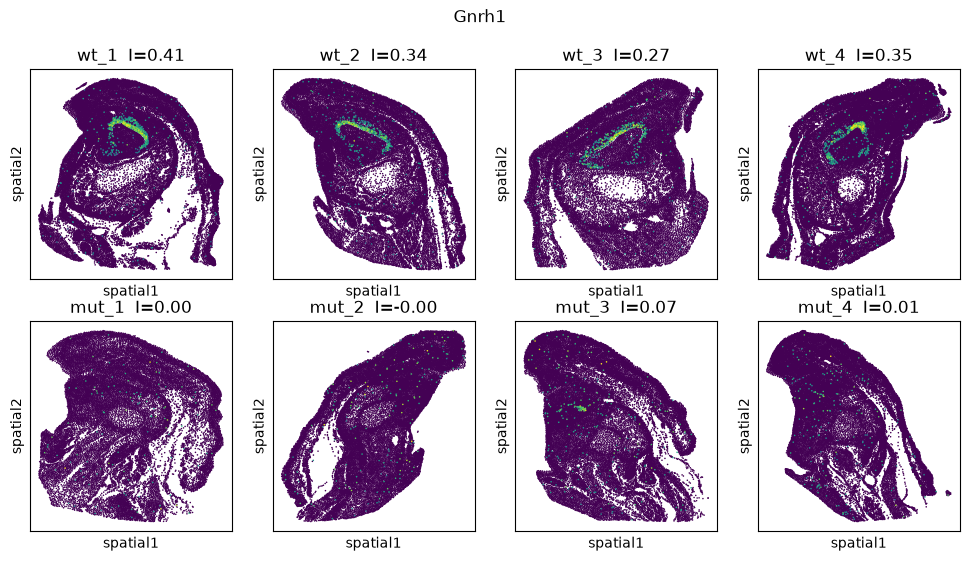

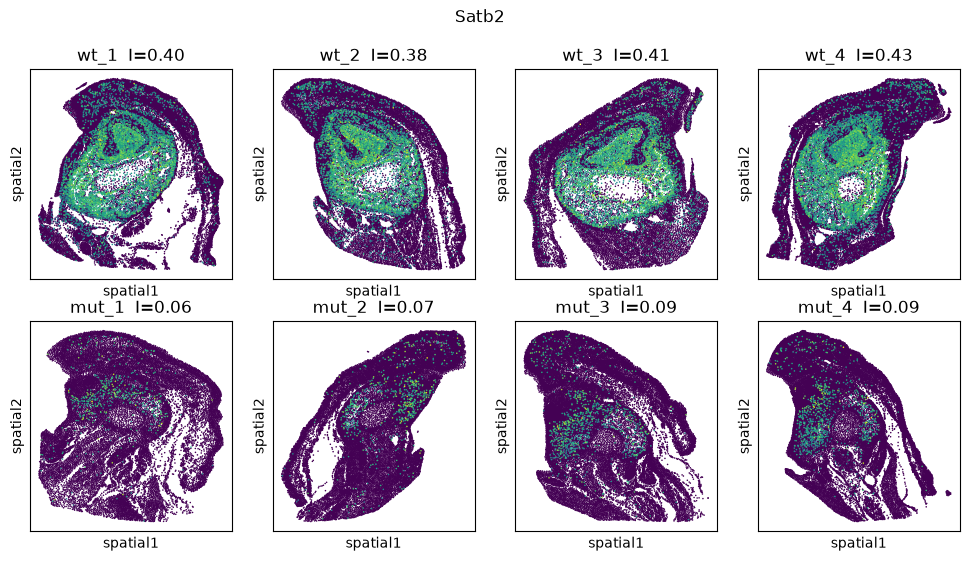

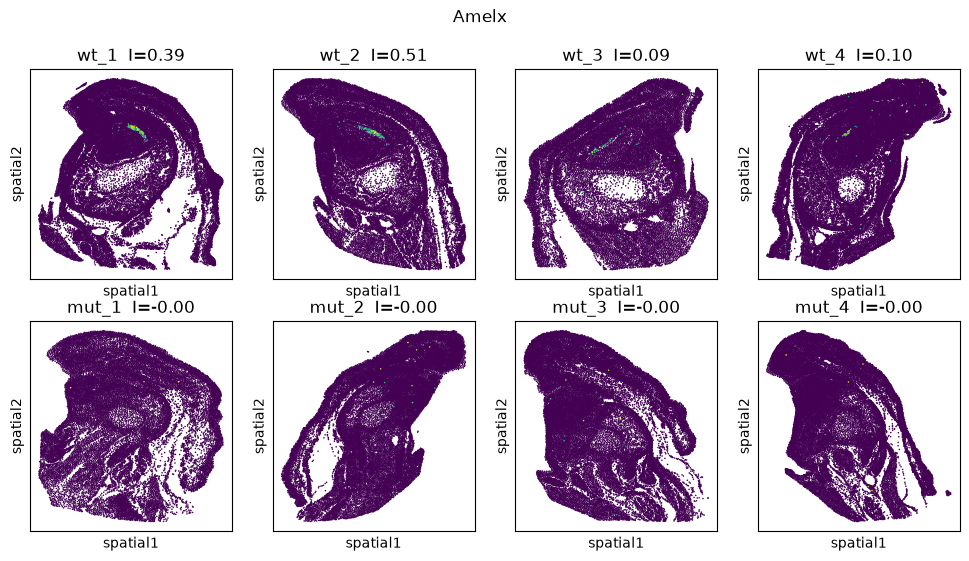

In [72]:
for g in ["Gnrh1", "Satb2", "Amelx"]:                                       # top hits across all 8 sections
    fig, axs = plt.subplots(2, 4, figsize=(12, 6))
    for ax, s in zip(axs.flat, samples):
        sc.pl.embedding(adatas[s], basis="spatial", color=g, size=5, cmap="viridis",
                        ax=ax, show=False, colorbar_loc=None, title=f"{s}  I={I.loc[g, s]:.2f}")
    fig.suptitle(g); plt.show()

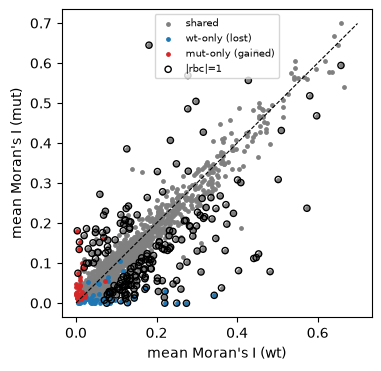

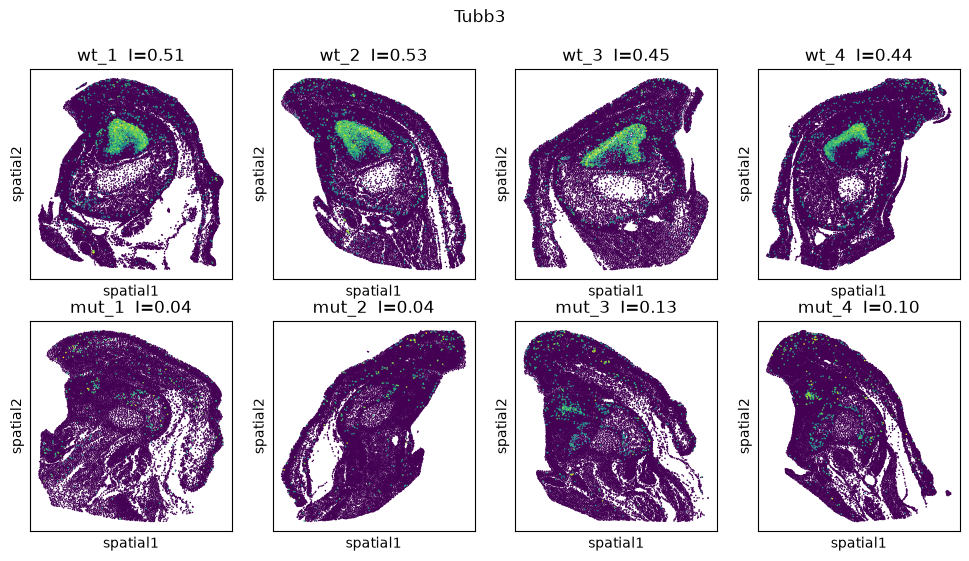

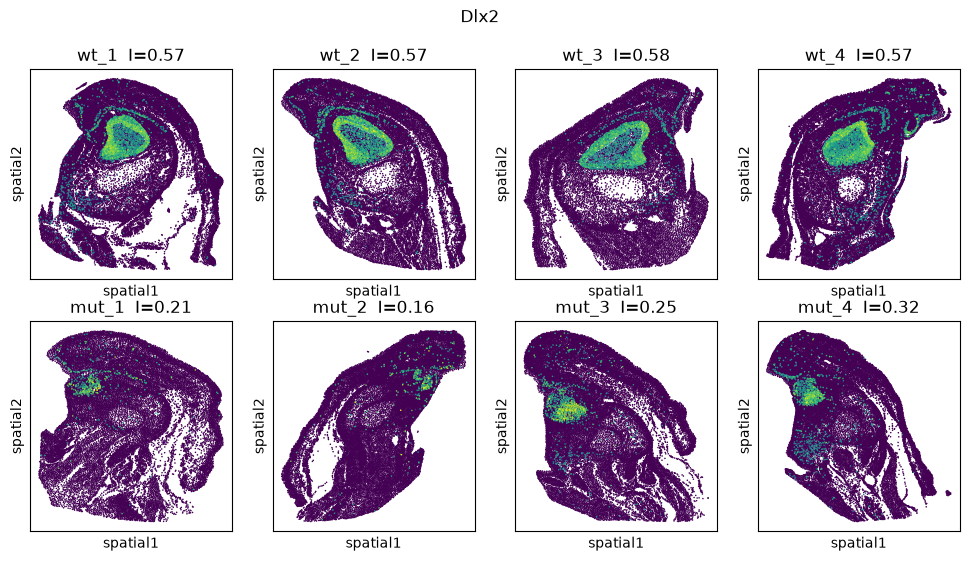

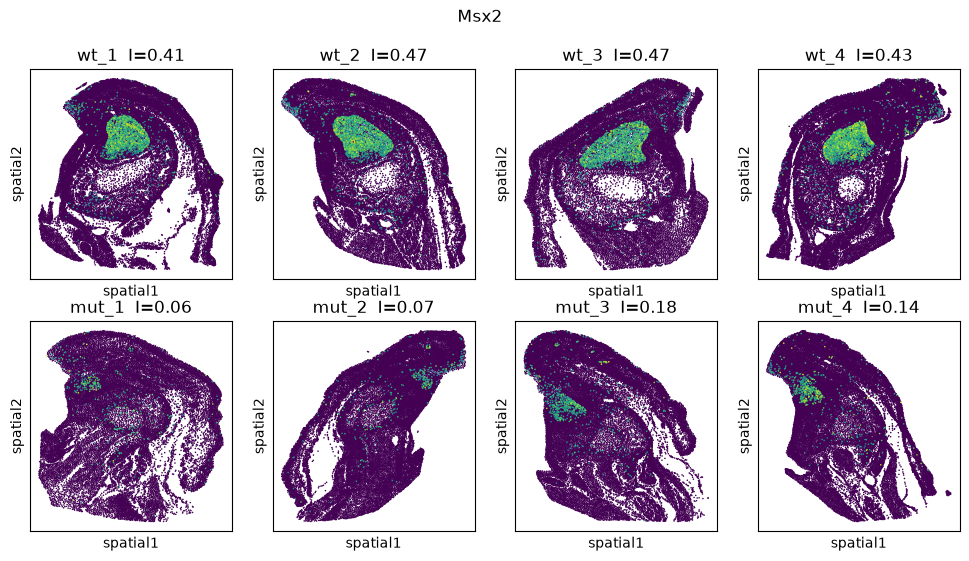

In [71]:
# ---------- visualisation ----------
fig, ax = plt.subplots(figsize=(4, 4))
for c, col in zip(["shared", "wt-only (lost)", "mut-only (gained)"], ["grey", "tab:blue", "tab:red"]):
    d = res[res["class"] == c]; ax.scatter(d.I_wt, d.I_mut, s=6, c=col, label=c)
ax.scatter(diff.I_wt, diff.I_mut, s=20, facecolors="none", edgecolors="k", label="|rbc|=1")
lim = [0, res[["I_wt", "I_mut"]].max().max()]; ax.plot(lim, lim, "k--", lw=.8)
ax.set(xlabel="mean Moran's I (wt)", ylabel="mean Moran's I (mut)"); ax.legend(fontsize=7); plt.show()

for g in diff.index[:3]:                                       # top hits across all 8 sections
    fig, axs = plt.subplots(2, 4, figsize=(12, 6))
    for ax, s in zip(axs.flat, samples):
        sc.pl.embedding(adatas[s], basis="spatial", color=g, size=5, cmap="viridis",
                        ax=ax, show=False, colorbar_loc=None, title=f"{s}  I={I.loc[g, s]:.2f}")
    fig.suptitle(g); plt.show()

# Spatial domains

In [141]:
def plot_domain_annotation_fraction(sample):
    a = adatas[sample]
    prop = pd.crosstab(a.obs["squidpy_domains"], a.obs["annotation"], normalize="index")  # rows sum to 1
    cmap = {cat: u.L2_COLORS[cat] for cat in a.obs["annotation"].cat.categories}

    ax = prop.plot.bar(stacked=True, width=.85, figsize=(.5 * len(prop) + 2, 5),
                    color=[cmap[c] for c in prop.columns], edgecolor="none")
    n = a.obs["squidpy_domains"].value_counts().reindex(prop.index)
    ax.set_xticklabels([f"{d}\n(n={k})" for d, k in n.items()], rotation=75, fontsize=8)
    ax.set(ylabel="cell-type fraction", xlabel="domain", ylim=(0, 1), title=sample)
    ax.legend(bbox_to_anchor=(1.01, 1), loc="upper left", fontsize=7, frameon=False)
    plt.tight_layout(); plt.show()

In [84]:
nn_graph_genes = {}
nn_graph_space = {}
joint_graph = {}

In [165]:
alpha = 0.2
for sample in samples:
    nn_graph_genes[sample] = adatas[sample].obsp["connectivities"]
    sq.gr.spatial_neighbors(adatas[sample])
    nn_graph_space[sample] = adatas[sample].obsp["spatial_connectivities"]
    joint_graph[sample] = (1 - alpha) * nn_graph_genes[sample] + alpha * nn_graph_space[sample]
    sc.tl.leiden(adatas[sample], adjacency=joint_graph[sample], key_added="squidpy_domains")
    print(f"sample {sample}: {adatas[sample].obs['squidpy_domains'].nunique()} domains")

INFO     Creating graph using `None` transform and `1` libraries.                                                  


C:\Users\sevco\AppData\Local\Temp\ipykernel_10972\570156047.py:4: FutureWarning: Calling `spatial_neighbors` is deprecated and will be removed in squidpy v1.9.0. Use `spatial_neighbors_knn`, `spatial_neighbors_radius`, `spatial_neighbors_delaunay`, `spatial_neighbors_grid`, or `spatial_neighbors_from_builder` instead.
  sq.gr.spatial_neighbors(adatas[sample])


sample wt_1: 16 domains
INFO     Creating graph using `None` transform and `1` libraries.                                                  


C:\Users\sevco\AppData\Local\Temp\ipykernel_10972\570156047.py:4: FutureWarning: Calling `spatial_neighbors` is deprecated and will be removed in squidpy v1.9.0. Use `spatial_neighbors_knn`, `spatial_neighbors_radius`, `spatial_neighbors_delaunay`, `spatial_neighbors_grid`, or `spatial_neighbors_from_builder` instead.
  sq.gr.spatial_neighbors(adatas[sample])


sample wt_2: 16 domains
INFO     Creating graph using `None` transform and `1` libraries.                                                  


C:\Users\sevco\AppData\Local\Temp\ipykernel_10972\570156047.py:4: FutureWarning: Calling `spatial_neighbors` is deprecated and will be removed in squidpy v1.9.0. Use `spatial_neighbors_knn`, `spatial_neighbors_radius`, `spatial_neighbors_delaunay`, `spatial_neighbors_grid`, or `spatial_neighbors_from_builder` instead.
  sq.gr.spatial_neighbors(adatas[sample])


sample wt_3: 17 domains
INFO     Creating graph using `None` transform and `1` libraries.                                                  


C:\Users\sevco\AppData\Local\Temp\ipykernel_10972\570156047.py:4: FutureWarning: Calling `spatial_neighbors` is deprecated and will be removed in squidpy v1.9.0. Use `spatial_neighbors_knn`, `spatial_neighbors_radius`, `spatial_neighbors_delaunay`, `spatial_neighbors_grid`, or `spatial_neighbors_from_builder` instead.
  sq.gr.spatial_neighbors(adatas[sample])


sample wt_4: 16 domains
INFO     Creating graph using `None` transform and `1` libraries.                                                  


C:\Users\sevco\AppData\Local\Temp\ipykernel_10972\570156047.py:4: FutureWarning: Calling `spatial_neighbors` is deprecated and will be removed in squidpy v1.9.0. Use `spatial_neighbors_knn`, `spatial_neighbors_radius`, `spatial_neighbors_delaunay`, `spatial_neighbors_grid`, or `spatial_neighbors_from_builder` instead.
  sq.gr.spatial_neighbors(adatas[sample])


sample mut_1: 14 domains
INFO     Creating graph using `None` transform and `1` libraries.                                                  


C:\Users\sevco\AppData\Local\Temp\ipykernel_10972\570156047.py:4: FutureWarning: Calling `spatial_neighbors` is deprecated and will be removed in squidpy v1.9.0. Use `spatial_neighbors_knn`, `spatial_neighbors_radius`, `spatial_neighbors_delaunay`, `spatial_neighbors_grid`, or `spatial_neighbors_from_builder` instead.
  sq.gr.spatial_neighbors(adatas[sample])


sample mut_2: 13 domains
INFO     Creating graph using `None` transform and `1` libraries.                                                  


C:\Users\sevco\AppData\Local\Temp\ipykernel_10972\570156047.py:4: FutureWarning: Calling `spatial_neighbors` is deprecated and will be removed in squidpy v1.9.0. Use `spatial_neighbors_knn`, `spatial_neighbors_radius`, `spatial_neighbors_delaunay`, `spatial_neighbors_grid`, or `spatial_neighbors_from_builder` instead.
  sq.gr.spatial_neighbors(adatas[sample])


sample mut_3: 15 domains
INFO     Creating graph using `None` transform and `1` libraries.                                                  


C:\Users\sevco\AppData\Local\Temp\ipykernel_10972\570156047.py:4: FutureWarning: Calling `spatial_neighbors` is deprecated and will be removed in squidpy v1.9.0. Use `spatial_neighbors_knn`, `spatial_neighbors_radius`, `spatial_neighbors_delaunay`, `spatial_neighbors_grid`, or `spatial_neighbors_from_builder` instead.
  sq.gr.spatial_neighbors(adatas[sample])


sample mut_4: 15 domains


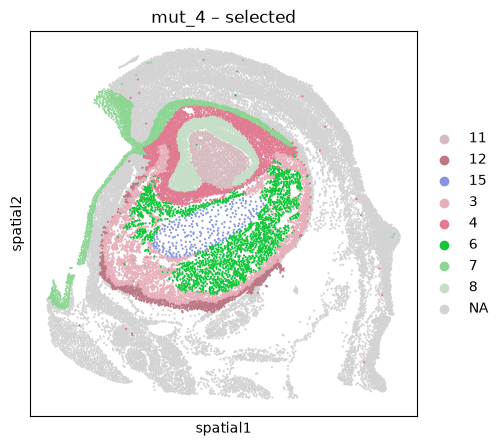

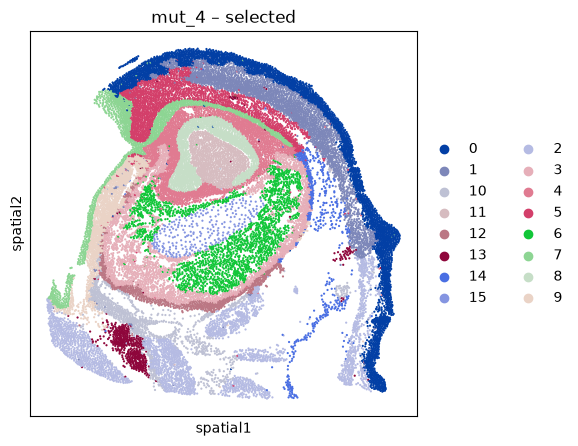

<Figure size 640x480 with 0 Axes>

In [184]:
domains_mask_keep = {
    "wt_1": ["11", "6", "7", "15", "3", "4", "8", "12"],

}

for domains_mask_keep["wt_1"], keep in domains_mask_keep.items():
    a = adatas["wt_1"]
    a.obs["squidpy_domains"] = a.obs["squidpy_domains"].astype(str).astype("category")  # match "11", "6", …
    with plt.rc_context({"figure.figsize": (5, 5)}):
        sc.pl.embedding(a, basis="spatial", color="squidpy_domains", groups=keep, size=10, legend_loc="right margin", title=f"{s} – selected")
    with plt.rc_context({"figure.figsize": (5, 5)}):
            sc.pl.embedding(a, basis="spatial", color="squidpy_domains", size=10, legend_loc="right margin", title=f"{s} – selected")
    for ax in axs: ax.set_aspect("equal"); ax.set_xlabel(""); ax.set_ylabel("")
    plt.tight_layout(); plt.show()

In [ ]:
nn_graph_genes[sample] = adatas[sample].obsp["connectivities"]
sq.gr.spatial_neighbors(adatas[sample])
nn_graph_space[sample] = adatas[sample].obsp["spatial_connectivities"]

INFO     Creating graph using `None` transform and `1` libraries.                                                  


C:\Users\sevco\AppData\Local\Temp\ipykernel_10972\39249247.py:2: FutureWarning: Calling `spatial_neighbors` is deprecated and will be removed in squidpy v1.9.0. Use `spatial_neighbors_knn`, `spatial_neighbors_radius`, `spatial_neighbors_delaunay`, `spatial_neighbors_grid`, or `spatial_neighbors_from_builder` instead.
  sq.gr.spatial_neighbors(adatas[sample])


Plotting sample: wt_1


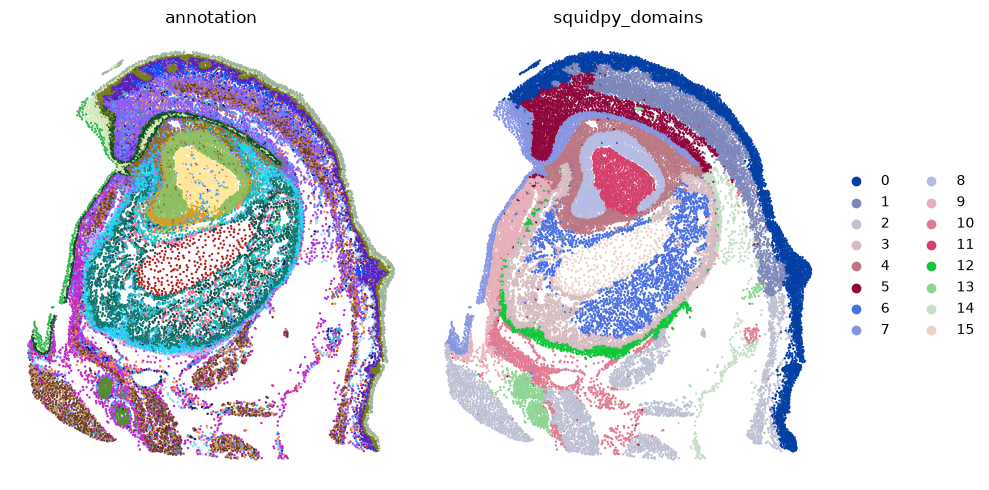

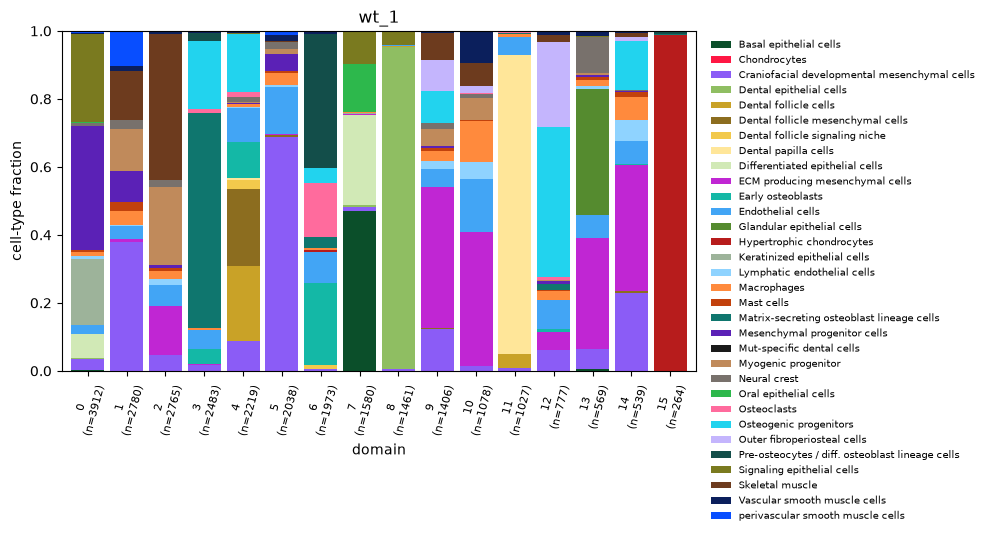

Plotting sample: wt_2


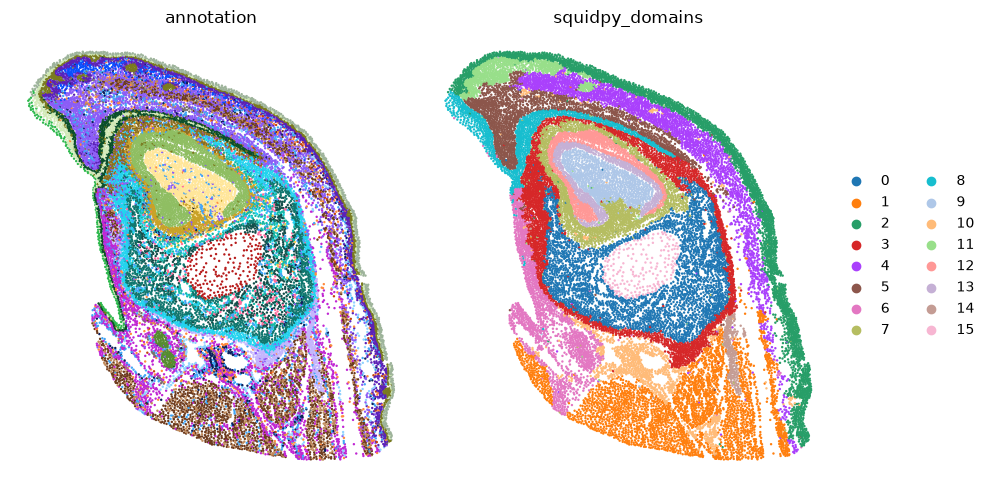

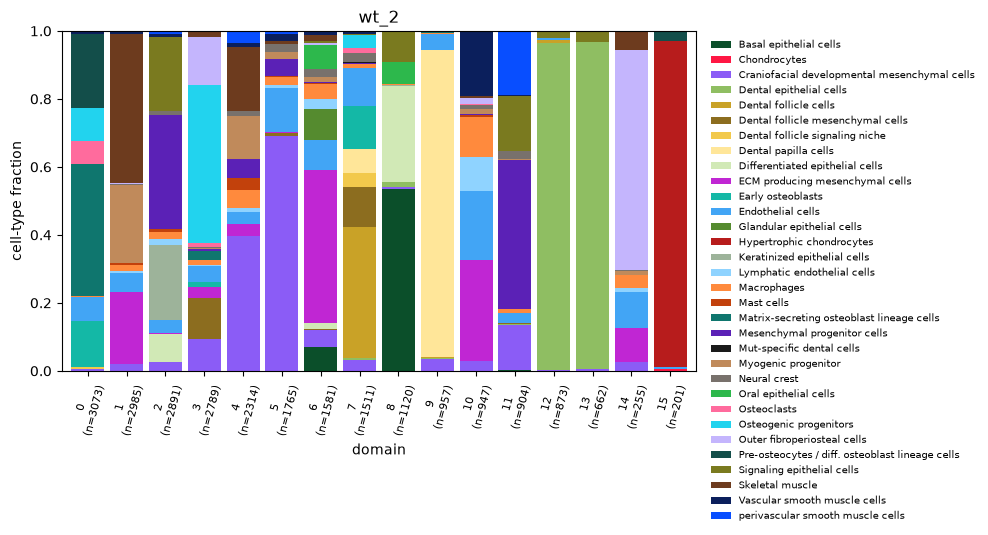

Plotting sample: wt_3


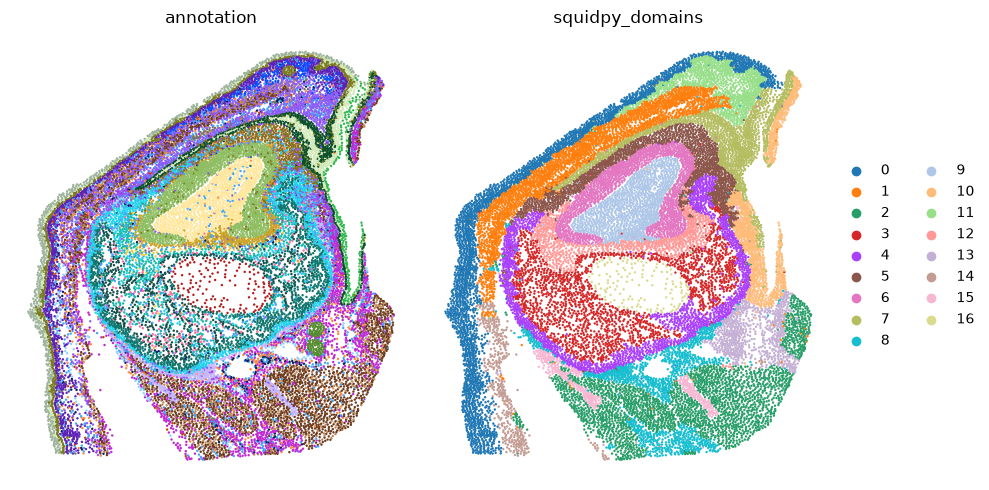

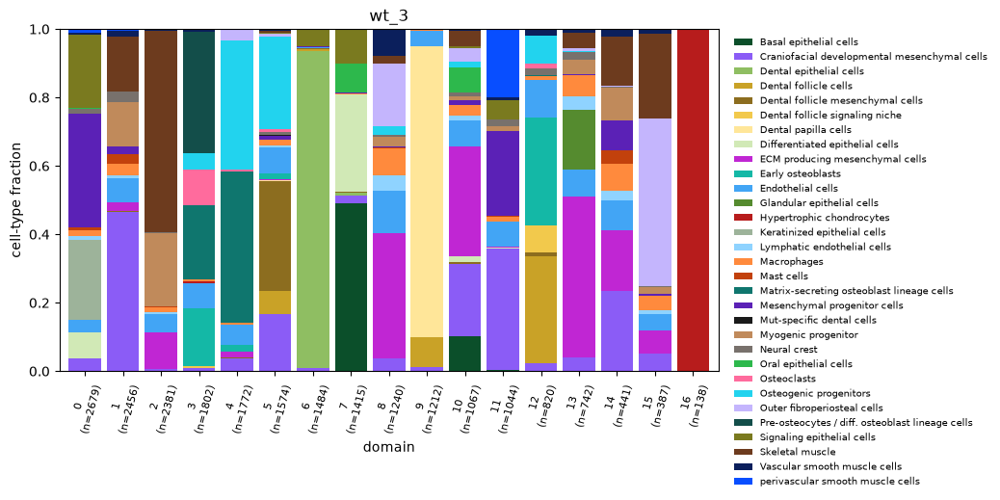

Plotting sample: wt_4


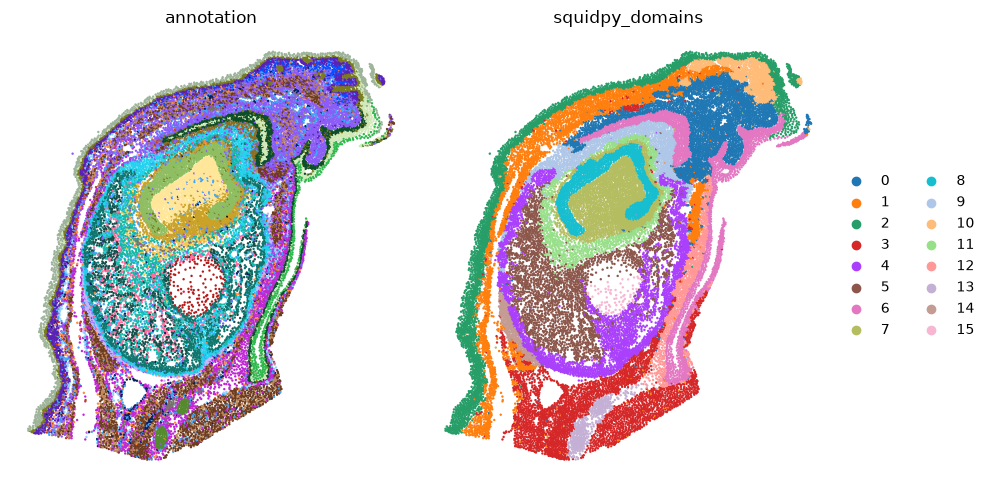

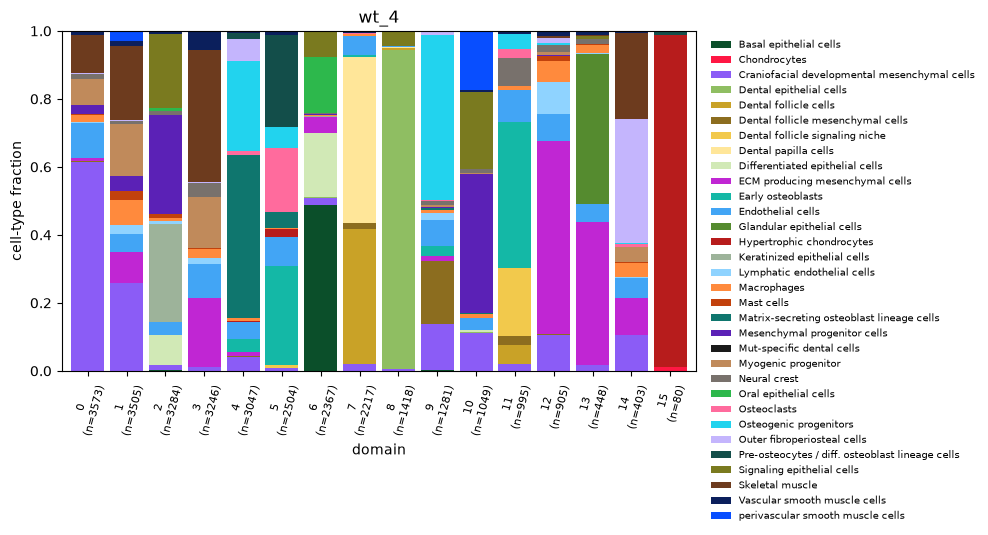

Plotting sample: mut_1


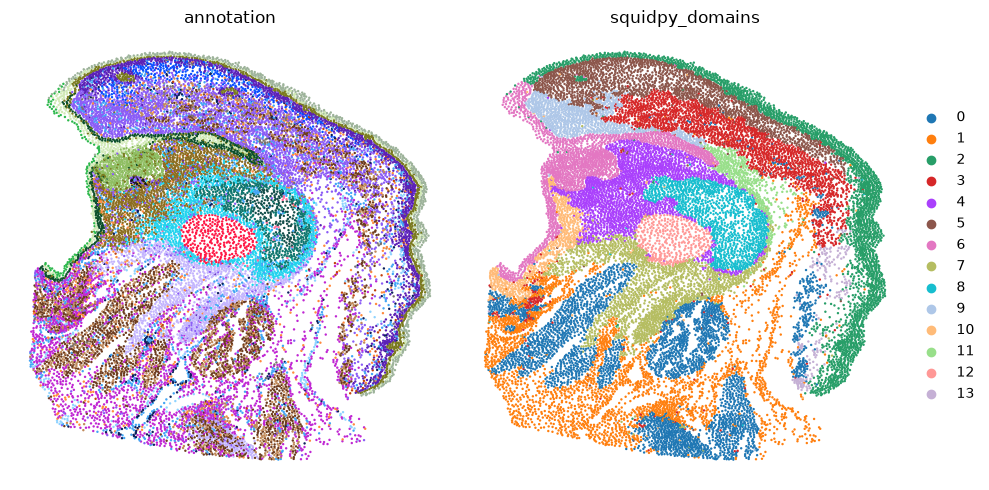

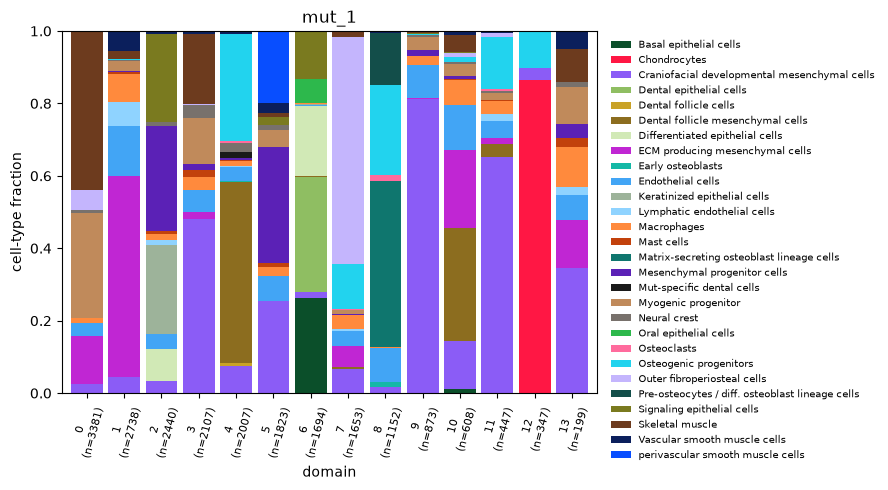

Plotting sample: mut_2


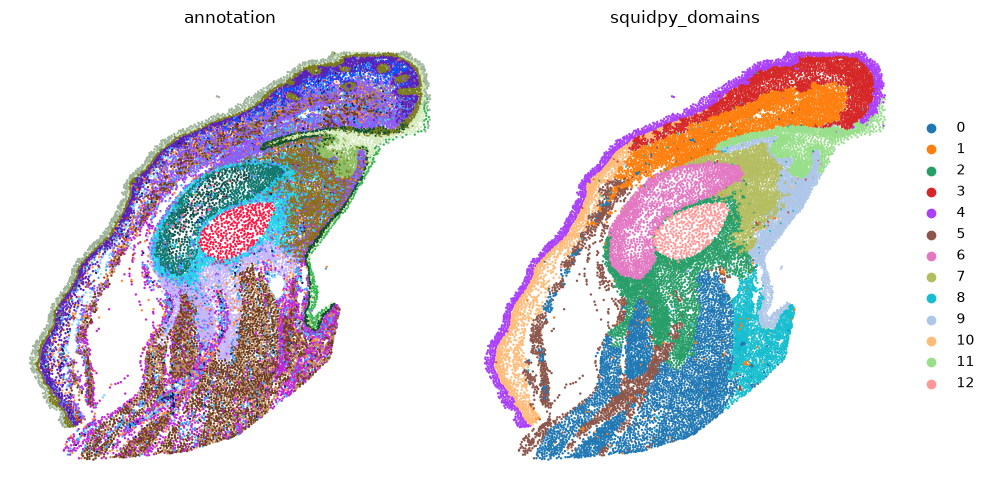

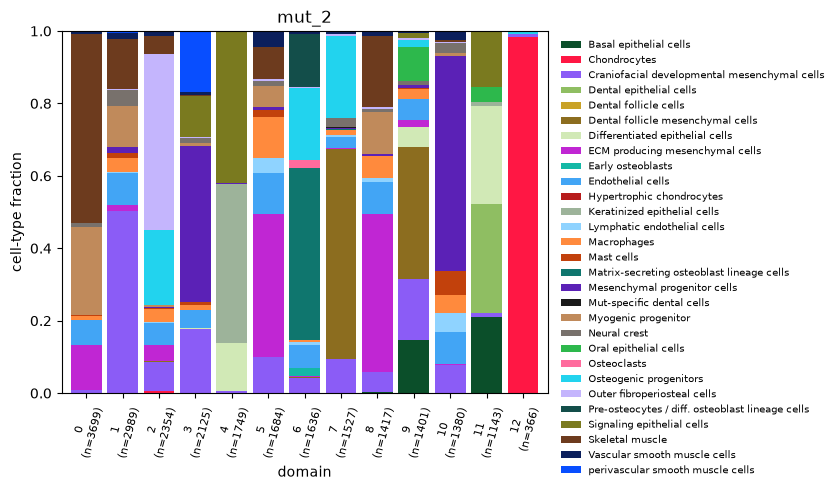

Plotting sample: mut_3


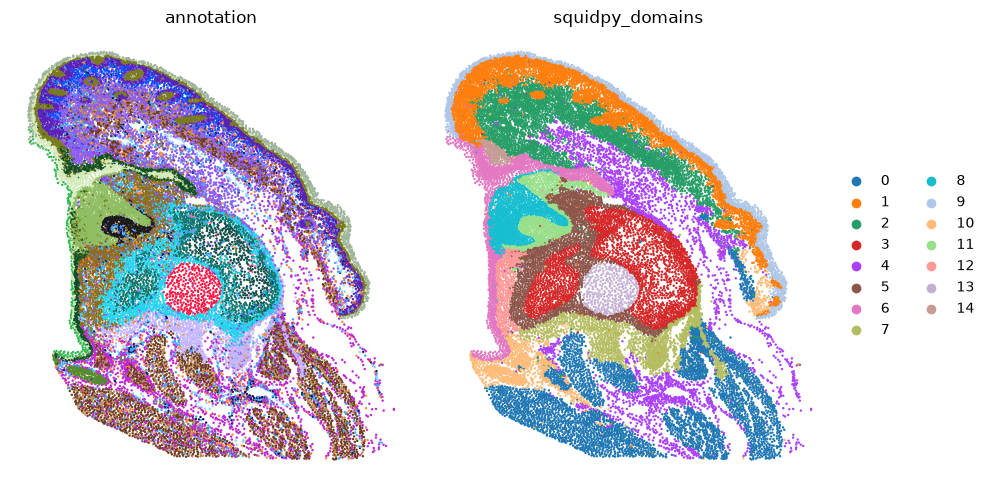

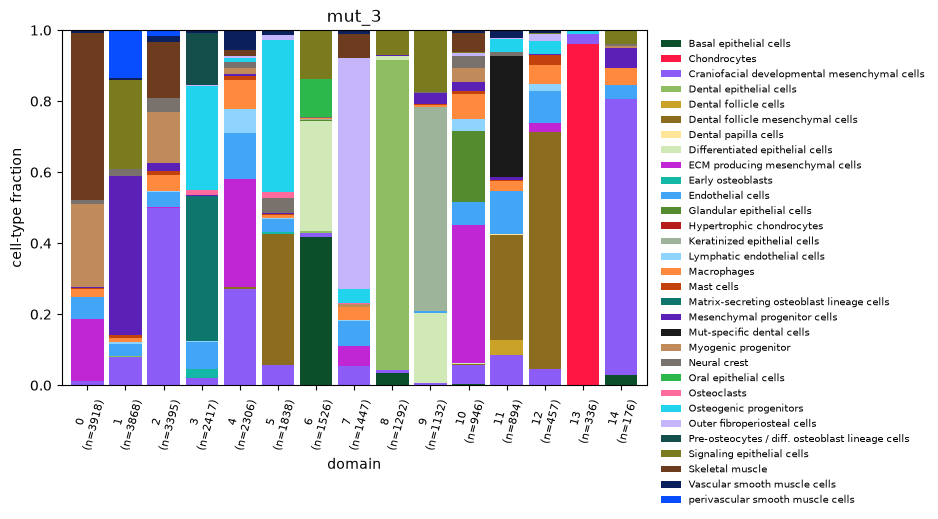

Plotting sample: mut_4


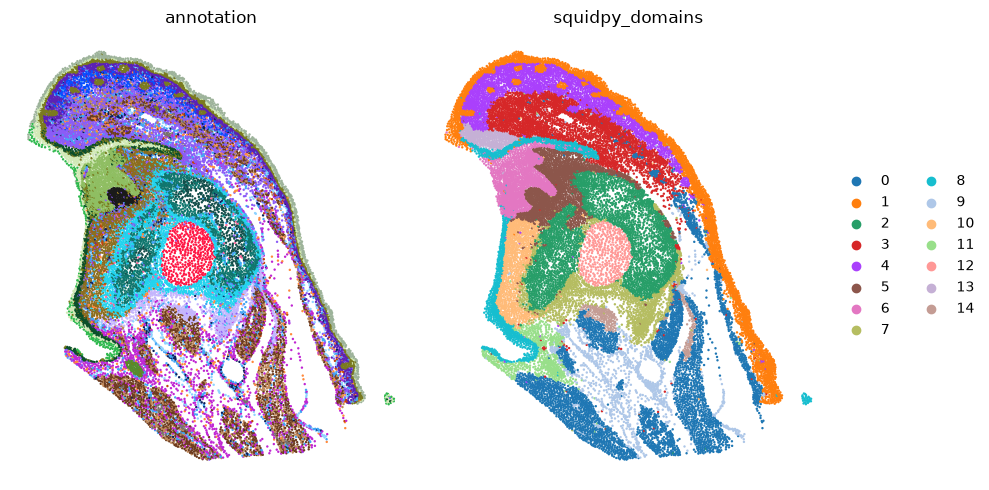

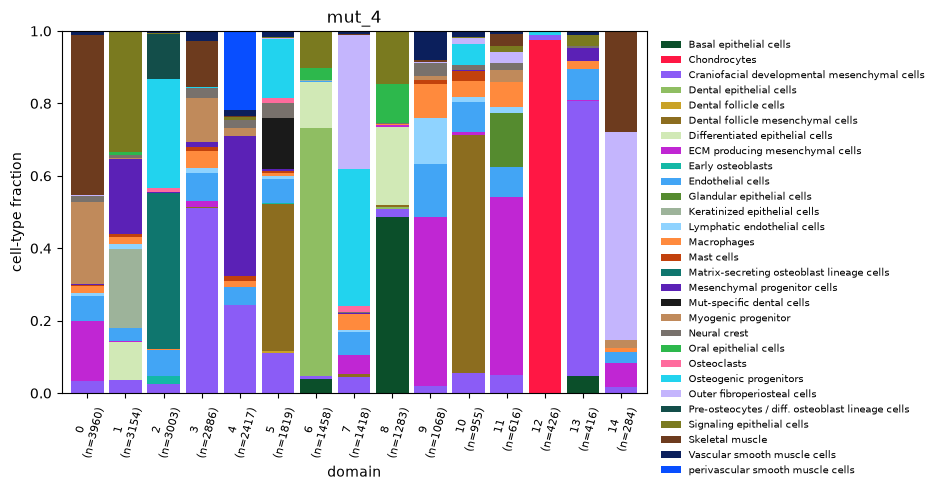

In [169]:
for sample in samples:    
    print(f"Plotting sample: {sample}")
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    sc.pl.embedding(adatas[sample], basis="spatial", color=["squidpy_domains"], size=12, frameon=False, colorbar_loc=None, ax=ax[1], show=False)
    cats = adatas[sample].obs["annotation"].cat.categories
    sc.pl.embedding(adatas[sample], basis="spatial", color=["annotation"], size=12, frameon=False, legend_loc=None, palette=[u.L2_COLORS[cat] for cat in cats], ax=ax[0], show=False)
    plt.tight_layout()
    plt.show()
    plot_domain_annotation_fraction(sample)